In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

# Data spleating and Concatination to avoid Data leakage

In [2]:
# import all the df
df_b = pd.read_csv("../Data/bureau_data.csv")
df_c = pd.read_csv("../Data/customers.csv")
df_l = pd.read_csv("../Data/loans.csv")


In [3]:
df_b.head()

,cust_id,number_of_open_accounts,number_of_closed_accounts,total_loan_months,delinquent_months,total_dpd,enquiry_count,credit_utilization_ratio
0,C00001,1,1,42,0,0,3,7
1,C00002,3,1,96,12,60,5,4
2,C00003,2,1,82,24,147,6,58
3,C00004,3,0,115,15,87,5,26
4,C00005,4,2,120,0,0,5,10


In [4]:
df_c.head()

,cust_id,age,gender,marital_status,employment_status,income,number_of_dependants,residence_type,years_at_current_address,city,state,zipcode
0,C00001,44,M,Married,Self-Employed,2586000,3,Owned,27,Delhi,Delhi,110001
1,C00002,38,M,Married,Salaried,1206000,3,Owned,4,Chennai,Tamil Nadu,600001
2,C00003,46,F,Married,Self-Employed,2878000,3,Owned,24,Kolkata,West Bengal,700001
3,C00004,55,F,Single,Self-Employed,3547000,1,Owned,15,Bangalore,Karnataka,560001
4,C00005,37,M,Married,Salaried,3432000,3,Owned,28,Pune,Maharashtra,411001


In [5]:
df_1 = df_b.merge(df_c,on='cust_id')
df_1.head()

,cust_id,number_of_open_accounts,number_of_closed_accounts,total_loan_months,delinquent_months,total_dpd,enquiry_count,credit_utilization_ratio,age,gender,marital_status,employment_status,income,number_of_dependants,residence_type,years_at_current_address,city,state,zipcode
0,C00001,1,1,42,0,0,3,7,44,M,Married,Self-Employed,2586000,3,Owned,27,Delhi,Delhi,110001
1,C00002,3,1,96,12,60,5,4,38,M,Married,Salaried,1206000,3,Owned,4,Chennai,Tamil Nadu,600001
2,C00003,2,1,82,24,147,6,58,46,F,Married,Self-Employed,2878000,3,Owned,24,Kolkata,West Bengal,700001
3,C00004,3,0,115,15,87,5,26,55,F,Single,Self-Employed,3547000,1,Owned,15,Bangalore,Karnataka,560001
4,C00005,4,2,120,0,0,5,10,37,M,Married,Salaried,3432000,3,Owned,28,Pune,Maharashtra,411001


In [6]:
df_b.shape,df_c.shape,df_1.shape

((50000, 8), (50000, 12), (50000, 19))

In [7]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   cust_id                    50000 non-null  object
 1   number_of_open_accounts    50000 non-null  int64 
 2   number_of_closed_accounts  50000 non-null  int64 
 3   total_loan_months          50000 non-null  int64 
 4   delinquent_months          50000 non-null  int64 
 5   total_dpd                  50000 non-null  int64 
 6   enquiry_count              50000 non-null  int64 
 7   credit_utilization_ratio   50000 non-null  int64 
 8   age                        50000 non-null  int64 
 9   gender                     50000 non-null  object
 10  marital_status             50000 non-null  object
 11  employment_status          50000 non-null  object
 12  income                     50000 non-null  int64 
 13  number_of_dependants       50000 non-null  int64 
 14  reside

In [8]:
df_l.head()

,loan_id,cust_id,loan_purpose,loan_type,sanction_amount,loan_amount,processing_fee,gst,net_disbursement,loan_tenure_months,principal_outstanding,bank_balance_at_application,disbursal_date,installment_start_dt,default
0,L00001,C00001,Auto,Secured,3004000,2467000,49340.0,444060,1973600,33,1630408,873386,2019-07-24,2019-08-10,False
1,L00002,C00002,Home,Secured,4161000,3883000,77660.0,698940,3106400,30,709309,464100,2019-07-24,2019-08-15,False
2,L00003,C00003,Personal,Unsecured,2401000,2170000,43400.0,390600,1736000,21,1562399,1476042,2019-07-24,2019-08-21,False
3,L00004,C00004,Personal,Unsecured,2345000,1747000,34940.0,314460,1397600,6,1257839,1031094,2019-07-24,2019-08-09,False
4,L00005,C00005,Auto,Secured,4647000,4520000,90400.0,813600,3616000,28,1772334,1032458,2019-07-24,2019-08-02,False


In [9]:
df = df_1.merge(df_l,on='cust_id')
df.shape

(50000, 33)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 33 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   cust_id                      50000 non-null  object 
 1   number_of_open_accounts      50000 non-null  int64  
 2   number_of_closed_accounts    50000 non-null  int64  
 3   total_loan_months            50000 non-null  int64  
 4   delinquent_months            50000 non-null  int64  
 5   total_dpd                    50000 non-null  int64  
 6   enquiry_count                50000 non-null  int64  
 7   credit_utilization_ratio     50000 non-null  int64  
 8   age                          50000 non-null  int64  
 9   gender                       50000 non-null  object 
 10  marital_status               50000 non-null  object 
 11  employment_status            50000 non-null  object 
 12  income                       50000 non-null  int64  
 13  number_of_depend

In [11]:
df.head()

,cust_id,number_of_open_accounts,number_of_closed_accounts,total_loan_months,delinquent_months,total_dpd,enquiry_count,credit_utilization_ratio,age,gender,...,loan_amount,processing_fee,gst,net_disbursement,loan_tenure_months,principal_outstanding,bank_balance_at_application,disbursal_date,installment_start_dt,default
0,C00001,1,1,42,0,0,3,7,44,M,...,2467000,49340.0,444060,1973600,33,1630408,873386,2019-07-24,2019-08-10,False
1,C00002,3,1,96,12,60,5,4,38,M,...,3883000,77660.0,698940,3106400,30,709309,464100,2019-07-24,2019-08-15,False
2,C00003,2,1,82,24,147,6,58,46,F,...,2170000,43400.0,390600,1736000,21,1562399,1476042,2019-07-24,2019-08-21,False
3,C00004,3,0,115,15,87,5,26,55,F,...,1747000,34940.0,314460,1397600,6,1257839,1031094,2019-07-24,2019-08-09,False
4,C00005,4,2,120,0,0,5,10,37,M,...,4520000,90400.0,813600,3616000,28,1772334,1032458,2019-07-24,2019-08-02,False


In [12]:
# Target id Default
df['default'] = df['default'].astype(int)
df['default'].value_counts()

default
0    45703
1     4297
Name: count, dtype: int64

In [13]:
X = df.drop('default',axis=1)
y = df['default']

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=42)

X_train.shape,y_train.shape,X_test.shape,y_test.shape

((37500, 32), (37500,), (12500, 32), (12500,))

In [14]:
# now we will concatibnate tain and validation sets

df_train = pd.concat([X_train,y_train],axis = 1,)
df_test = pd.concat([X_test,y_test],axis=1)


df_train.shape,df_test.shape

((37500, 33), (12500, 33))

# Data Cleaning

In [15]:
df_train.isna().sum()

cust_id                         0
number_of_open_accounts         0
number_of_closed_accounts       0
total_loan_months               0
delinquent_months               0
total_dpd                       0
enquiry_count                   0
credit_utilization_ratio        0
age                             0
gender                          0
marital_status                  0
employment_status               0
income                          0
number_of_dependants            0
residence_type                 48
years_at_current_address        0
city                            0
state                           0
zipcode                         0
loan_id                         0
loan_purpose                    0
loan_type                       0
sanction_amount                 0
loan_amount                     0
processing_fee                  0
gst                             0
net_disbursement                0
loan_tenure_months              0
principal_outstanding           0
bank_balance_a

In [16]:
print(df_train.residence_type.value_counts())
df_train.residence_type.mode()

residence_type
Owned       21114
Mortgage     8901
Rented       7437
Name: count, dtype: int64


0    Owned
Name: residence_type, dtype: object

In [17]:
df_train.residence_type = df_train.residence_type.fillna(df_train.residence_type.mode()[0])

#same for test
df_test.residence_type = df_test.residence_type.fillna(df_test.residence_type.mode()[0])

df_train['residence_type'].mode() → returns something like 0 'Owned'

df_train['residence_type'].mode()[0] → extracts 'Owned'

In [18]:
df_train.isna().sum()

cust_id                        0
number_of_open_accounts        0
number_of_closed_accounts      0
total_loan_months              0
delinquent_months              0
total_dpd                      0
enquiry_count                  0
credit_utilization_ratio       0
age                            0
gender                         0
marital_status                 0
employment_status              0
income                         0
number_of_dependants           0
residence_type                 0
years_at_current_address       0
city                           0
state                          0
zipcode                        0
loan_id                        0
loan_purpose                   0
loan_type                      0
sanction_amount                0
loan_amount                    0
processing_fee                 0
gst                            0
net_disbursement               0
loan_tenure_months             0
principal_outstanding          0
bank_balance_at_application    0
disbursal_

In [19]:
# Fetch categorical columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

# Fetch numerical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

print("Categorical Columns:", categorical_cols)
print('\n')
print("Numerical Columns:", numerical_cols)

Categorical Columns: ['cust_id', 'gender', 'marital_status', 'employment_status', 'residence_type', 'city', 'state', 'loan_id', 'loan_purpose', 'loan_type', 'disbursal_date', 'installment_start_dt']


Numerical Columns: ['number_of_open_accounts', 'number_of_closed_accounts', 'total_loan_months', 'delinquent_months', 'total_dpd', 'enquiry_count', 'credit_utilization_ratio', 'age', 'income', 'number_of_dependants', 'years_at_current_address', 'zipcode', 'sanction_amount', 'loan_amount', 'processing_fee', 'gst', 'net_disbursement', 'loan_tenure_months', 'principal_outstanding', 'bank_balance_at_application', 'default']


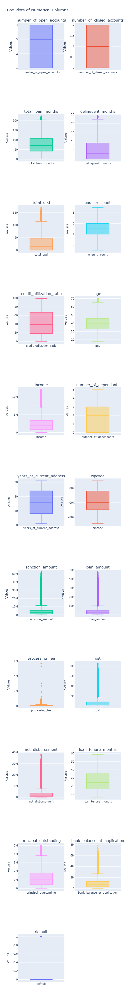

In [20]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math

# Assuming you have a DataFrame called 'df' and a list called 'numerical_cols'
# numerical_cols = ['col1', 'col2', 'col3', ...]

# Calculate number of rows needed (2 plots per row)
n_cols = 2
n_rows = math.ceil(len(numerical_cols) / n_cols)

# Calculate appropriate spacing based on number of rows
vertical_spacing = min(0.1, 0.5 / n_rows) if n_rows > 1 else 0.1
horizontal_spacing = 0.1

# Create subplots
fig = make_subplots(
    rows=n_rows, 
    cols=n_cols,
    subplot_titles=numerical_cols,
    vertical_spacing=vertical_spacing,
    horizontal_spacing=horizontal_spacing
)

# Add box plots
for i, col in enumerate(numerical_cols):
    row = (i // n_cols) + 1
    col_pos = (i % n_cols) + 1
    
    fig.add_trace(
        go.Box(y=df[col].dropna(), name=col, showlegend=False),
        row=row,
        col=col_pos
    )
    
    # Update y-axis label
    fig.update_yaxes(title_text="Values", row=row, col=col_pos)

# Update layout
fig.update_layout(
    height=400 * n_rows,
    width=900,
    title_text="Box Plots of Numerical Columns",
    showlegend=False
)

fig.show()

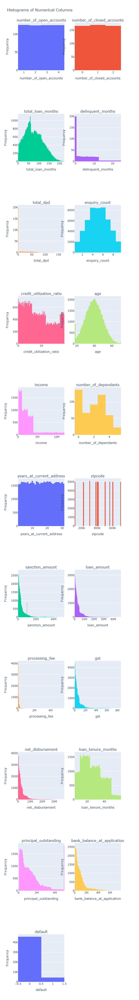

In [21]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math


n_cols = 2
n_rows = math.ceil(len(numerical_cols) / n_cols)

# Calculate appropriate spacing based on number of rows
vertical_spacing = min(0.1, 0.5 / n_rows) if n_rows > 1 else 0.1
horizontal_spacing = 0.1

# Create subplots
fig = make_subplots(
    rows=n_rows, 
    cols=n_cols,
    subplot_titles=numerical_cols,
    vertical_spacing=vertical_spacing,
    horizontal_spacing=horizontal_spacing
)

# Add histograms
for i, col in enumerate(numerical_cols):
    row = (i // n_cols) + 1
    col_pos = (i % n_cols) + 1
    
    fig.add_trace(
        go.Histogram(x=df[col].dropna(), name=col, showlegend=False),
        row=row,
        col=col_pos
    )
    
    # Update axis labels
    fig.update_xaxes(title_text=col, row=row, col=col_pos)
    fig.update_yaxes(title_text="Frequency", row=row, col=col_pos)

# Update layout
fig.update_layout(
    height=400 * n_rows,
    width=900,
    title_text="Histograms of Numerical Columns",
    showlegend=False
)

fig.show()

In [22]:
# now we will check the processing fee as it has narower hstogram and itx box plot shows lower values

df_train.processing_fee.describe()

count    3.750000e+04
mean     8.072411e+04
std      1.208307e+05
min      0.000000e+00
25%      1.918000e+04
50%      4.470000e+04
75%      9.200000e+04
max      5.698030e+06
Name: processing_fee, dtype: float64

In [23]:
df_train[df_train.processing_fee<df_train.loan_amount][['loan_amount','processing_fee']]

,loan_amount,processing_fee
27434,3276000,65520.0
13400,2540000,50800.0
883,1920000,38400.0
7303,298000,5960.0
45124,260000,5200.0
...,...,...
11284,4760000,95200.0
44732,5302000,106040.0
38158,6570000,131400.0
860,3194000,63880.0


In [24]:
df_train_1 = df_train[(df_train.processing_fee/df_train.loan_amount)>0.003].copy()

#Same for test
df_train_1.columns

Index(['cust_id', 'number_of_open_accounts', 'number_of_closed_accounts',
       'total_loan_months', 'delinquent_months', 'total_dpd', 'enquiry_count',
       'credit_utilization_ratio', 'age', 'gender', 'marital_status',
       'employment_status', 'income', 'number_of_dependants', 'residence_type',
       'years_at_current_address', 'city', 'state', 'zipcode', 'loan_id',
       'loan_purpose', 'loan_type', 'sanction_amount', 'loan_amount',
       'processing_fee', 'gst', 'net_disbursement', 'loan_tenure_months',
       'principal_outstanding', 'bank_balance_at_application',
       'disbursal_date', 'installment_start_dt', 'default'],
      dtype='object')

In [25]:
df_test = df_test[(df_test.processing_fee/df_test.loan_amount)>0.003].copy()
df_test.columns

Index(['cust_id', 'number_of_open_accounts', 'number_of_closed_accounts',
       'total_loan_months', 'delinquent_months', 'total_dpd', 'enquiry_count',
       'credit_utilization_ratio', 'age', 'gender', 'marital_status',
       'employment_status', 'income', 'number_of_dependants', 'residence_type',
       'years_at_current_address', 'city', 'state', 'zipcode', 'loan_id',
       'loan_purpose', 'loan_type', 'sanction_amount', 'loan_amount',
       'processing_fee', 'gst', 'net_disbursement', 'loan_tenure_months',
       'principal_outstanding', 'bank_balance_at_application',
       'disbursal_date', 'installment_start_dt', 'default'],
      dtype='object')

In [26]:
for i in categorical_cols:
    print(f"{i} --> {df_train[i].unique()}")

cust_id --> ['C27435' 'C13401' 'C00884' ... 'C38159' 'C00861' 'C15796']
gender --> ['F' 'M']
marital_status --> ['Single' 'Married']
employment_status --> ['Salaried' 'Self-Employed']
residence_type --> ['Owned' 'Mortgage' 'Rented']
city --> ['Ahmedabad' 'Delhi' 'Lucknow' 'Bangalore' 'Jaipur' 'Hyderabad' 'Kolkata'
 'Pune' 'Chennai' 'Mumbai']
state --> ['Gujarat' 'Delhi' 'Uttar Pradesh' 'Karnataka' 'Rajasthan' 'Telangana'
 'West Bengal' 'Maharashtra' 'Tamil Nadu']
loan_id --> ['L27435' 'L13401' 'L00884' ... 'L38159' 'L00861' 'L15796']
loan_purpose --> ['Home' 'Auto' 'Personal' 'Education' 'Personaal']
loan_type --> ['Secured' 'Unsecured']
disbursal_date --> ['2022-04-21' '2020-11-24' '2019-08-25' ... '2024-04-06' '2021-11-30'
 '2021-11-24']
installment_start_dt --> ['2022-05-21' '2020-12-11' '2019-09-19' ... '2024-08-16' '2019-07-27'
 '2022-12-02']


In [27]:
df_train_1['loan_purpose'] = df_train_1['loan_purpose'].replace('Personaal','Personal')
df_test['loan_purpose'] = df_test['loan_purpose'].replace('Personaal','Personal')

In [28]:
df_train_1['loan_purpose'].unique()

array(['Home', 'Auto', 'Personal', 'Education'], dtype=object)

# EDA

In [29]:
# function for determinig the continous columns in the dataframe
def find_continuous_columns(df, exclude_binary=True, max_columns=None):
    if not isinstance(df, pd.DataFrame):
        raise TypeError("Input must be a pandas DataFrame")
    
    if df.empty:
        return []
    
    continuous_cols = []
    
    # Iterate through all columns
    for col in df.columns:
        # Check if column is numeric (int or float)
        if pd.api.types.is_numeric_dtype(df[col]):
            if exclude_binary:
                # Exclude binary columns (only 2 unique values)
                unique_vals = df[col].nunique()
                if unique_vals > 2:
                    continuous_cols.append(col)
            else:
                continuous_cols.append(col)
    
    # Limit to max_columns if specified
    if max_columns is not None:
        continuous_cols = continuous_cols[:max_columns]
    
    return continuous_cols


def get_column_info(df, continuous_cols):
    info_list = []
    
    for col in continuous_cols:
        info_list.append({
            'column': col,
            'dtype': df[col].dtype,
            'unique_values': df[col].nunique(),
            'missing_values': df[col].isna().sum(),
            'min': df[col].min(),
            'max': df[col].max(),
            'mean': df[col].mean()
        })
    
    return pd.DataFrame(info_list)

In [30]:
continuous_cols = find_continuous_columns(df_train_1)
continuous_cols

['number_of_open_accounts',
 'number_of_closed_accounts',
 'total_loan_months',
 'delinquent_months',
 'total_dpd',
 'enquiry_count',
 'credit_utilization_ratio',
 'age',
 'income',
 'number_of_dependants',
 'years_at_current_address',
 'zipcode',
 'sanction_amount',
 'loan_amount',
 'processing_fee',
 'gst',
 'net_disbursement',
 'loan_tenure_months',
 'principal_outstanding',
 'bank_balance_at_application']

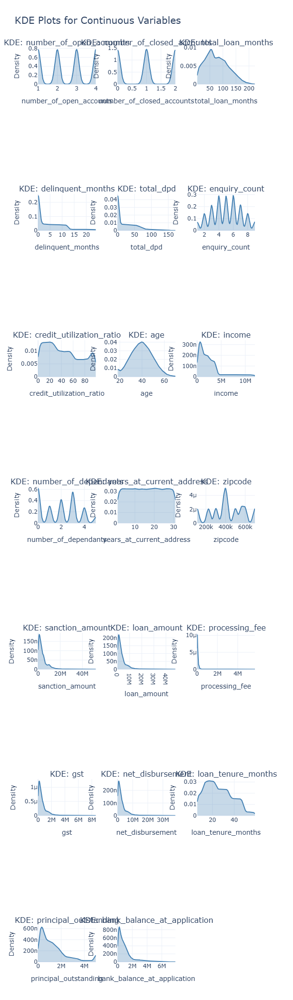

In [31]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats


# ==================== Multi-panel KDE Plot ====================
cols_per_row = 3
n_cols = len(continuous_cols)
n_rows = (n_cols + cols_per_row - 1) // cols_per_row

# Create subplot titles
subplot_titles = [f'KDE: {col}' for col in continuous_cols]

# Create subplots
fig = make_subplots(
    rows=n_rows, 
    cols=cols_per_row,
    subplot_titles=subplot_titles,
    vertical_spacing=0.12,
    horizontal_spacing=0.1
)

# Plot KDE for each continuous column
for idx, col in enumerate(continuous_cols):
    row = idx // cols_per_row + 1
    col_pos = idx % cols_per_row + 1
    
    # Get data and remove NaN
    data = df[col].dropna()
    
    if len(data) > 1:
        # Calculate KDE using scipy
        kde = stats.gaussian_kde(data)
        x_range = np.linspace(data.min(), data.max(), 200)
        y_kde = kde(x_range)
        
        # Add KDE trace
        fig.add_trace(
            go.Scatter(
                x=x_range,
                y=y_kde,
                mode='lines',
                name=col,
                fill='tozeroy',
                line=dict(color='steelblue', width=2),
                fillcolor='rgba(70, 130, 180, 0.3)',
                showlegend=False,
                hovertemplate=f'<b>{col}</b><br>Value: %{{x:.2f}}<br>Density: %{{y:.4f}}<extra></extra>'
            ),
            row=row,
            col=col_pos
        )
        
        # Update axes
        fig.update_xaxes(title_text=col, row=row, col=col_pos)
        fig.update_yaxes(title_text='Density', row=row, col=col_pos)

# Update layout
fig.update_layout(
    title_text='KDE Plots for Continuous Variables',
    title_font_size=20,
    height=300 * n_rows,
    showlegend=False,
    template='plotly_white'
)

fig.show()


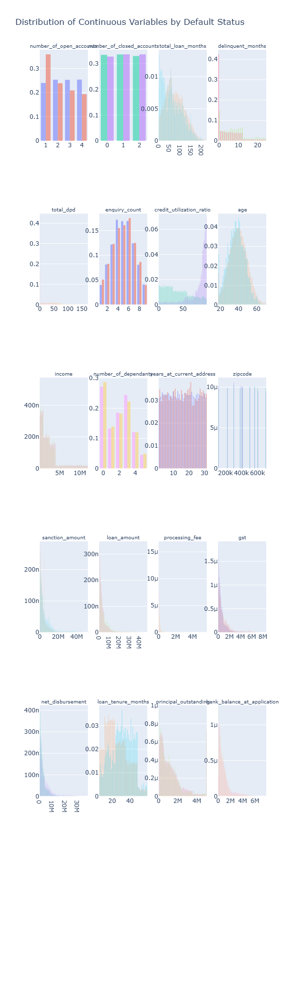

In [32]:
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go

# Create subplot grid (6 rows, 4 columns)
fig = sp.make_subplots(
    rows=6, cols=4,
    subplot_titles=continuous_cols,
    horizontal_spacing=0.05, vertical_spacing=0.08
)

# Loop through columns and add KDE plots
for i, col in enumerate(continuous_cols):
    row = i // 4 + 1
    col_pos = i % 4 + 1

    # Default = 0
    kde0 = px.density_contour(df_train_1[df_train_1['default'] == 0], x=col)
    kde0_traces = px.density_contour(df_train_1[df_train_1['default'] == 0], x=col)
    
    trace0 = go.Histogram(
        x=df_train_1[df_train_1['default'] == 0][col],
        histnorm='probability density',
        name='default=0',
        opacity=0.5
    )

    trace1 = go.Histogram(
        x=df_train_1[df_train_1['default'] == 1][col],
        histnorm='probability density',
        name='default=1',
        opacity=0.5
    )

    # Add both traces to subplot
    fig.add_trace(trace0, row=row, col=col_pos)
    fig.add_trace(trace1, row=row, col=col_pos)

# Update layout
fig.update_layout(
    height=2000, width=2400,
    title_text="Distribution of Continuous Variables by Default Status",
    showlegend=False,
)

# Tight layout
fig.update_annotations(font_size=10)
fig.show()


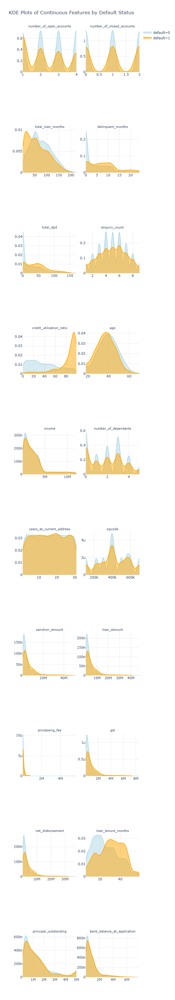

In [33]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.stats import gaussian_kde

# Number of plots per row
cols_per_row = 2
rows = int(np.ceil(len(continuous_cols) / cols_per_row))

# Adjust spacing for a clean layout
vertical_space = 0.08 if rows < 6 else max(0.02, 0.6 / rows)
horizontal_space = 0.08

# Create subplot grid
fig = make_subplots(
    rows=rows, cols=cols_per_row,
    subplot_titles=continuous_cols,
    horizontal_spacing=horizontal_space,
    vertical_spacing=vertical_space
)

# Loop through each continuous column
for i, col in enumerate(continuous_cols):
    row = i // cols_per_row + 1
    col_pos = i % cols_per_row + 1

    # KDE for default = 0
    data0 = df_train_1[df_train_1['default'] == 0][col].dropna()
    if len(data0) > 1:
        kde0 = gaussian_kde(data0)
        x_vals0 = np.linspace(data0.min(), data0.max(), 200)
        y_vals0 = kde0(x_vals0)
        fig.add_trace(go.Scatter(
            x=x_vals0, y=y_vals0,
            mode='lines',
            name='default=0',
            line=dict(color='lightblue', width=2),
            fill='tozeroy',
            opacity=0.6,
            showlegend=(i == 0)
        ), row=row, col=col_pos)

    # KDE for default = 1
    data1 = df_train_1[df_train_1['default'] == 1][col].dropna()
    if len(data1) > 1:
        kde1 = gaussian_kde(data1)
        x_vals1 = np.linspace(data1.min(), data1.max(), 200)
        y_vals1 = kde1(x_vals1)
        fig.add_trace(go.Scatter(
            x=x_vals1, y=y_vals1,
            mode='lines',
            name='default=1',
            line=dict(color='orange', width=2),
            fill='tozeroy',
            opacity=0.6,
            showlegend=(i == 0)
        ), row=row, col=col_pos)

# Layout updates
fig.update_layout(
    height=350 * rows,
    width=1200,
    title_text="KDE Plots of Continuous Features by Default Status",
    showlegend=True,
    legend=dict(x=1.02, y=1),
    plot_bgcolor='white',
)

# Make subplots titles readable
fig.update_annotations(font_size=11)

# Cleaner axes
fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')

fig.show()


Insights
1. Orange graph of age column shows that people with younger age is moe likelly to default

# Feature Engeanearing

In [34]:
df_train_1.select_dtypes(['int64','float64']).info()

<class 'pandas.core.frame.DataFrame'>
Index: 37494 entries, 27434 to 15795
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   number_of_open_accounts      37494 non-null  int64  
 1   number_of_closed_accounts    37494 non-null  int64  
 2   total_loan_months            37494 non-null  int64  
 3   delinquent_months            37494 non-null  int64  
 4   total_dpd                    37494 non-null  int64  
 5   enquiry_count                37494 non-null  int64  
 6   credit_utilization_ratio     37494 non-null  int64  
 7   age                          37494 non-null  int64  
 8   income                       37494 non-null  int64  
 9   number_of_dependants         37494 non-null  int64  
 10  years_at_current_address     37494 non-null  int64  
 11  zipcode                      37494 non-null  int64  
 12  sanction_amount              37494 non-null  int64  
 13  loan_amount      

In [35]:
# loan to income
df_train_1['loan_to_income'] = round(df_train_1['loan_amount']/df_train_1['income'],2)

df_test['loan_to_income'] = round(df_test['loan_amount']/df_test['income'],2)


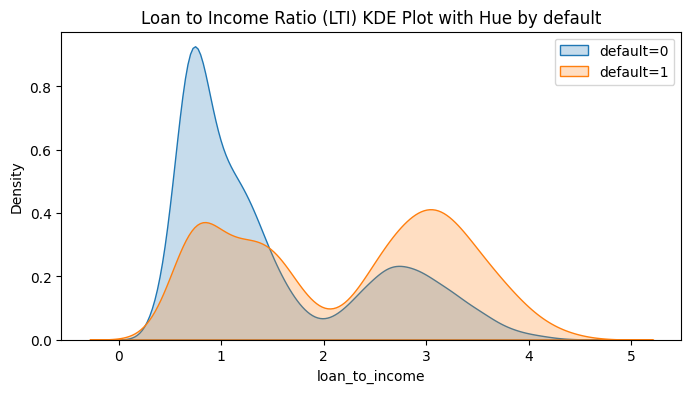

In [36]:
plt.figure(figsize=(8, 4))
sns.kdeplot(df_train_1['loan_to_income'][df_train_1['default'] == 0], fill=True, label='default=0')
sns.kdeplot(df_train_1['loan_to_income'][df_train_1['default'] == 1], fill=True, label='default=1')
plt.title(f"Loan to Income Ratio (LTI) KDE Plot with Hue by default")
plt.legend()
plt.show()

In [37]:
# deliquent_onths to total loan months
# loan to income
df_train_1['delinquency_ratio'] = (df_train_1['delinquent_months']*100 / df_train_1['total_loan_months']).round(1)
df_test['delinquency_ratio'] = (df_test['delinquent_months']*100 / df_test['total_loan_months']).round(1)
#kde plot

# for test and train
# remove na by np.where

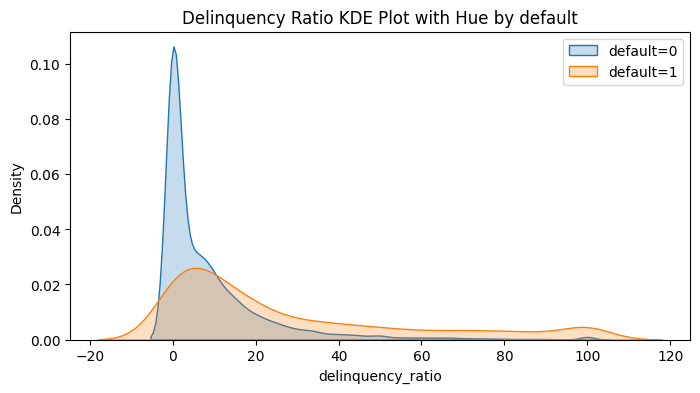

In [38]:
plt.figure(figsize=(8, 4))
sns.kdeplot(df_train_1['delinquency_ratio'][df_train_1['default'] == 0], fill=True, label='default=0')
sns.kdeplot(df_train_1['delinquency_ratio'][df_train_1['default'] == 1], fill=True, label='default=1')
plt.title(f"Delinquency Ratio KDE Plot with Hue by default")
plt.legend()
plt.show()

**Insights**
1. Blue graph has majority of its values on lower side of LTI
2. Orange graph has many values when delinquency ratio is higher indicating some correlation on default

#### Generate Avg DPD Per Delinquency

In [39]:
df_train_1['avg_dpd_per_delinquency'] = np.where(
    df_train_1['delinquent_months'] != 0,
    (df_train_1['total_dpd'] / df_train_1['delinquent_months']).round(1),
    0
)

df_test['avg_dpd_per_delinquency'] = np.where(
    df_test['delinquent_months'] != 0,
    (df_test['total_dpd'] / df_test['delinquent_months']).round(1),
    0
)

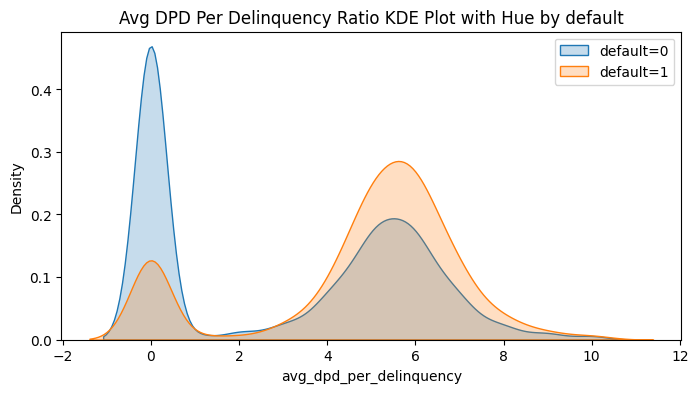

In [40]:
plt.figure(figsize=(8, 4))
sns.kdeplot(df_train_1['avg_dpd_per_delinquency'][df_train_1['default'] == 0], fill=True, label='default=0')
sns.kdeplot(df_train_1['avg_dpd_per_delinquency'][df_train_1['default'] == 1], fill=True, label='default=1')
plt.title(f"Avg DPD Per Delinquency Ratio KDE Plot with Hue by default")
plt.legend()
plt.show()

**Insights**

1. Graph clearly shows more occurances of default cases when avg_dpd_per_delinquency is high. This means this column is a strong predictor

# Feature Selection

## For Numerical Columns

### Remove columns that are just unique ids and don't have influence on target

In [41]:
df_train_1.columns

Index(['cust_id', 'number_of_open_accounts', 'number_of_closed_accounts',
       'total_loan_months', 'delinquent_months', 'total_dpd', 'enquiry_count',
       'credit_utilization_ratio', 'age', 'gender', 'marital_status',
       'employment_status', 'income', 'number_of_dependants', 'residence_type',
       'years_at_current_address', 'city', 'state', 'zipcode', 'loan_id',
       'loan_purpose', 'loan_type', 'sanction_amount', 'loan_amount',
       'processing_fee', 'gst', 'net_disbursement', 'loan_tenure_months',
       'principal_outstanding', 'bank_balance_at_application',
       'disbursal_date', 'installment_start_dt', 'default', 'loan_to_income',
       'delinquency_ratio', 'avg_dpd_per_delinquency'],
      dtype='object')

### Removed by techinical Knoledge

In [42]:
df_train_2 = df_train_1.drop(['cust_id', 'loan_id'],axis="columns")
df_test = df_test.drop(['cust_id', 'loan_id'],axis="columns")

### Remove columns that business contact person asked us to removee


In [43]:
df_train_3 = df_train_2.drop(['disbursal_date', 'installment_start_dt', 'loan_amount', 'income', 
                              'total_loan_months', 'delinquent_months', 'total_dpd'], axis="columns")
df_test = df_test.drop(['disbursal_date', 'installment_start_dt', 'loan_amount', 'income', 
                              'total_loan_months', 'delinquent_months', 'total_dpd'], axis="columns")
df_train_3.columns

Index(['number_of_open_accounts', 'number_of_closed_accounts', 'enquiry_count',
       'credit_utilization_ratio', 'age', 'gender', 'marital_status',
       'employment_status', 'number_of_dependants', 'residence_type',
       'years_at_current_address', 'city', 'state', 'zipcode', 'loan_purpose',
       'loan_type', 'sanction_amount', 'processing_fee', 'gst',
       'net_disbursement', 'loan_tenure_months', 'principal_outstanding',
       'bank_balance_at_application', 'default', 'loan_to_income',
       'delinquency_ratio', 'avg_dpd_per_delinquency'],
      dtype='object')

In [44]:
df_train_3.select_dtypes(['int64', 'float64']).columns

Index(['number_of_open_accounts', 'number_of_closed_accounts', 'enquiry_count',
       'credit_utilization_ratio', 'age', 'number_of_dependants',
       'years_at_current_address', 'zipcode', 'sanction_amount',
       'processing_fee', 'gst', 'net_disbursement', 'loan_tenure_months',
       'principal_outstanding', 'bank_balance_at_application', 'default',
       'loan_to_income', 'delinquency_ratio', 'avg_dpd_per_delinquency'],
      dtype='object')

### VIF to measure multicolinearity

In [45]:
X_train = df_train_3.drop('default', axis='columns')
y_train = df_train_3['default']

from sklearn.preprocessing import MinMaxScaler

cols_to_scale = X_train.select_dtypes(['int64', 'float64']).columns

scaler = MinMaxScaler()

X_train[cols_to_scale] = scaler.fit_transform(X_train[cols_to_scale])
X_train.describe()

,number_of_open_accounts,number_of_closed_accounts,enquiry_count,credit_utilization_ratio,age,number_of_dependants,years_at_current_address,zipcode,sanction_amount,processing_fee,gst,net_disbursement,loan_tenure_months,principal_outstanding,bank_balance_at_application,loan_to_income,delinquency_ratio,avg_dpd_per_delinquency
count,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000,37494.000000
mean,0.498800,0.498400,0.500380,0.437667,0.414701,0.388478,0.499783,0.523318,0.088985,0.013996,0.083026,0.083026,0.375405,0.261944,0.123698,0.293853,0.103936,0.329448
std,0.372395,0.407531,0.252991,0.296520,0.189513,0.307159,0.297938,0.286165,0.120699,0.021210,0.113428,0.113428,0.234406,0.244503,0.133523,0.227840,0.172675,0.290319
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.375000,0.181818,0.288462,0.000000,0.233333,0.325424,0.020445,0.003195,0.019111,0.019111,0.188679,0.078179,0.034090,0.110070,0.000000,0.000000
50%,0.333333,0.500000,0.500000,0.393939,0.423077,0.400000,0.500000,0.491525,0.049536,0.007672,0.045887,0.045887,0.339623,0.194396,0.082725,0.201405,0.038000,0.430000
75%,0.666667,1.000000,0.625000,0.676768,0.538462,0.600000,0.766667,0.762712,0.097651,0.015973,0.095512,0.095512,0.547170,0.353198,0.155525,0.503513,0.131000,0.580000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#### Same transformation on test set

In [46]:
X_test = df_test.drop('default', axis='columns')
y_test = df_test['default']

X_test[cols_to_scale] = scaler.transform(X_test[cols_to_scale])
X_test.describe()

,number_of_open_accounts,number_of_closed_accounts,enquiry_count,credit_utilization_ratio,age,number_of_dependants,years_at_current_address,zipcode,sanction_amount,processing_fee,gst,net_disbursement,loan_tenure_months,principal_outstanding,bank_balance_at_application,loan_to_income,delinquency_ratio,avg_dpd_per_delinquency
count,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000,12498.000000
mean,0.503681,0.506961,0.503471,0.439030,0.413678,0.386174,0.503088,0.525588,0.088840,0.013835,0.082764,0.082764,0.378690,0.263201,0.124546,0.294318,0.104141,0.330698
std,0.374460,0.405600,0.255602,0.296583,0.189011,0.306940,0.296372,0.287152,0.119051,0.018617,0.111372,0.111372,0.235128,0.245299,0.134018,0.226731,0.173989,0.290731
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000019,0.000021,0.000126,0.000126,0.000000,-0.000163,0.000216,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.375000,0.181818,0.288462,0.000000,0.233333,0.325424,0.021208,0.003297,0.019725,0.019725,0.188679,0.078853,0.034518,0.110070,0.000000,0.000000
50%,0.666667,0.500000,0.500000,0.393939,0.423077,0.400000,0.500000,0.510169,0.049871,0.007730,0.046244,0.046244,0.358491,0.195309,0.083575,0.203747,0.038000,0.430000
75%,1.000000,1.000000,0.750000,0.676768,0.538462,0.600000,0.766667,0.762712,0.099138,0.016164,0.096693,0.096693,0.547170,0.354632,0.156611,0.503513,0.129000,0.577500
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.951002,0.167698,1.003192,1.003192,1.000000,1.000000,0.879450,1.004684,1.000000,1.000000


In [47]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(data):
    vif_df = pd.DataFrame()
    vif_df['Column'] = data.columns
    vif_df['VIF'] = [variance_inflation_factor(data.values,i) for i in range(data.shape[1])]
    return vif_df

In [48]:
calculate_vif(X_train[cols_to_scale])

E:\Data Science\Data-Science-project\credit-risk-modeling\.venv\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning:

divide by zero encountered in scalar divide



,Column,VIF
0,number_of_open_accounts,4.350551
1,number_of_closed_accounts,2.363119
2,enquiry_count,6.395799
3,credit_utilization_ratio,2.928208
4,age,5.718502
5,number_of_dependants,2.731833
6,years_at_current_address,3.424366
7,zipcode,3.793300
8,sanction_amount,102.155499
9,processing_fee,7.110714


In [49]:
features_to_drop_vif = ['sanction_amount', 'processing_fee', 'gst', 'net_disbursement','principal_outstanding']


X_train_1 = X_train.drop(features_to_drop_vif, axis='columns')
numeric_columns = X_train_1.select_dtypes(['int64', 'float64']).columns
numeric_columns

Index(['number_of_open_accounts', 'number_of_closed_accounts', 'enquiry_count',
       'credit_utilization_ratio', 'age', 'number_of_dependants',
       'years_at_current_address', 'zipcode', 'loan_tenure_months',
       'bank_balance_at_application', 'loan_to_income', 'delinquency_ratio',
       'avg_dpd_per_delinquency'],
      dtype='object')

In [50]:
calculate_vif(X_train_1[numeric_columns])

,Column,VIF
0,number_of_open_accounts,4.321043
1,number_of_closed_accounts,2.350958
2,enquiry_count,6.366759
3,credit_utilization_ratio,2.916144
4,age,5.446194
5,number_of_dependants,2.728318
6,years_at_current_address,3.407834
7,zipcode,3.771374
8,loan_tenure_months,5.982870
9,bank_balance_at_application,1.801362


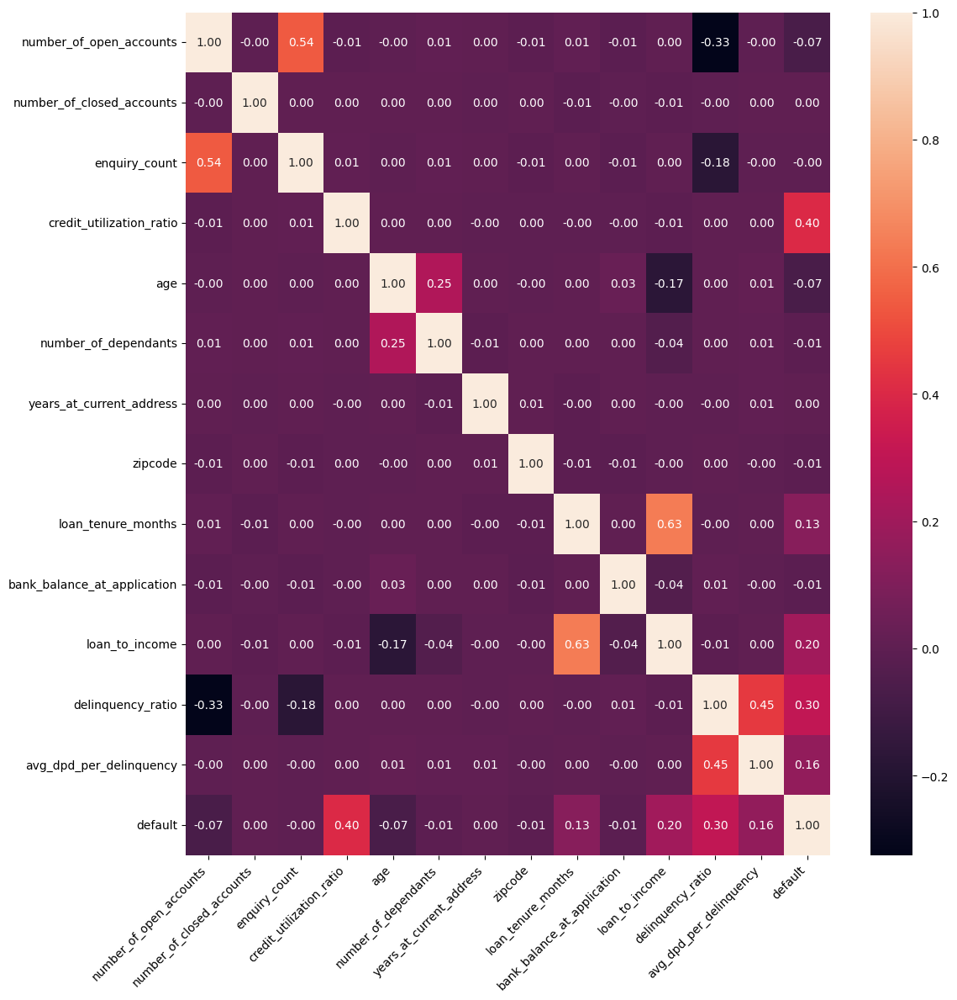

In [51]:
plt.figure(figsize=(12,12))
cm = df_train_3[numeric_columns.append(pd.Index(['default']))].corr()
sns.heatmap(cm, annot=True, fmt='0.2f')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [52]:
pd.concat([X_train_1,y_train],axis=1).groupby('gender')['default'].agg(['count','sum'])

,count,sum
gender,,
F,14926,1301
M,22568,1888


In [53]:
def calculate_woe_iv(df,feature,target):
    grouped = df.groupby(feature)[target].agg(['count','sum'])
    grouped = grouped.rename(columns={'count':'total','sum':'good'})
    grouped['bad'] = grouped['total'] - grouped['good']
    total_good = grouped.good.sum()
    total_bad = grouped.bad.sum()
    grouped['good%'] = grouped.good/total_good
    grouped['bad%'] = grouped.bad/total_bad
    grouped['woe'] = np.log(grouped['good%']/grouped['bad%'])
    grouped['vi'] = (grouped['good%'] - grouped['bad%'])*grouped['woe']
    
    grouped['vi'] = grouped['vi'].replace([np.inf,-np.inf],0) 
    grouped['woe'] =   grouped['woe'].replace([np.inf,-np.inf],0)     
    total_vi = float(grouped['vi'].sum())
    return grouped, total_vi

In [54]:
grouped, total_vi = calculate_woe_iv(pd.concat([X_train_1,y_train],axis=1),'loan_purpose','default')

grouped

,total,good,bad,good%,bad%,woe,vi
loan_purpose,,,,,,,
Auto,7438,314,7124,0.098463,0.207667,-0.746248,0.081493
Education,5627,546,5081,0.171214,0.148113,0.144939,0.003348
Home,11271,1744,9527,0.546880,0.277715,0.677635,0.182396
Personal,13158,585,12573,0.183443,0.366506,-0.692111,0.126700


In [55]:
total_vi

0.39393682151759823

In [56]:
X_bins = pd.cut(X_train_1['loan_to_income'], bins=20, labels=False)
X_bins.value_counts()

loan_to_income
2     7031
1     6358
3     4184
4     3522
5     2327
11    2027
12    1852
10    1692
13    1487
9     1159
0     1151
6     1142
14    1131
15     684
8      600
7      524
16     353
17     187
18      63
19      20
Name: count, dtype: int64

In [57]:
iv_values = {}

for feature in X_train_1.columns:
    if X_train_1[feature].dtype == 'object':
        _,iv = calculate_woe_iv(pd.concat([X_train_1,y_train],axis=1),feature,'default')
    else:
        X_bined = pd.cut(X_train_1[feature],bins=20,labels=False)
        _,iv = calculate_woe_iv(pd.concat([X_bined,y_train],axis=1),feature,'default')
        
    iv_values[feature] = iv


iv_values

E:\Data Science\Data-Science-project\credit-risk-modeling\.venv\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning:

divide by zero encountered in log



{'number_of_open_accounts': 0.07326252060628016,
 'number_of_closed_accounts': 0.00026170019615294937,
 'enquiry_count': 0.005482137031027805,
 'credit_utilization_ratio': 2.46423479811607,
 'age': 0.0792494111229348,
 'gender': 0.0004843205126665575,
 'marital_status': 0.0022029609538779106,
 'employment_status': 0.002456731385497648,
 'number_of_dependants': 0.0036383466417877998,
 'residence_type': 0.25920741830697236,
 'years_at_current_address': 0.0037623264657457435,
 'city': 0.0008110255213862418,
 'state': 0.0007813565189811711,
 'zipcode': 0.0007401473002465401,
 'loan_purpose': 0.39393682151759823,
 'loan_type': 0.17317014743044423,
 'loan_tenure_months': 0.2604027141189313,
 'bank_balance_at_application': 0.007732769046202638,
 'loan_to_income': 0.5187282550175559,
 'delinquency_ratio': 0.7796067430668671,
 'avg_dpd_per_delinquency': 0.4293138755059815}

In [58]:
iv_df = pd.DataFrame(iv_values.items(),columns=['feature','iv_score']).sort_values(by = 'iv_score',ascending=False)
iv_df

,feature,iv_score
3,credit_utilization_ratio,2.464235
19,delinquency_ratio,0.779607
18,loan_to_income,0.518728
20,avg_dpd_per_delinquency,0.429314
14,loan_purpose,0.393937
16,loan_tenure_months,0.260403
9,residence_type,0.259207
15,loan_type,0.173170
4,age,0.079249
0,number_of_open_accounts,0.073263


In [59]:
selected_iv_features = [features for features,iv in iv_values.items() if iv>0.002]
selected_iv_features

['number_of_open_accounts',
 'enquiry_count',
 'credit_utilization_ratio',
 'age',
 'marital_status',
 'employment_status',
 'number_of_dependants',
 'residence_type',
 'years_at_current_address',
 'loan_purpose',
 'loan_type',
 'loan_tenure_months',
 'bank_balance_at_application',
 'loan_to_income',
 'delinquency_ratio',
 'avg_dpd_per_delinquency']

## Featuring Encoding

In [60]:
len(X_test.columns.to_list()),len(X_train_1.columns.to_list())

(26, 21)

In [61]:
X_train_reduced = X_train_1[selected_iv_features]
X_test_reduced = X_test[selected_iv_features]

In [62]:
X_train_reduced.head()

,number_of_open_accounts,enquiry_count,credit_utilization_ratio,age,marital_status,employment_status,number_of_dependants,residence_type,years_at_current_address,loan_purpose,loan_type,loan_tenure_months,bank_balance_at_application,loan_to_income,delinquency_ratio,avg_dpd_per_delinquency
27434,1.000000,0.875,0.595960,0.519231,Single,Salaried,0.0,Owned,0.133333,Home,Secured,0.339623,0.069846,0.608899,0.067,0.55
13400,0.666667,0.375,0.929293,0.211538,Single,Salaried,0.0,Owned,0.800000,Auto,Secured,0.509434,0.119061,0.182670,0.034,0.42
883,0.333333,0.375,0.838384,0.615385,Single,Self-Employed,0.0,Mortgage,0.933333,Personal,Unsecured,0.245283,0.096133,0.084309,0.169,0.56
7303,0.000000,0.500,0.343434,0.480769,Single,Self-Employed,0.2,Owned,0.866667,Auto,Secured,0.283019,0.012511,0.187354,0.000,0.00
45124,0.333333,0.500,0.191919,0.250000,Single,Salaried,0.0,Owned,0.866667,Education,Secured,0.735849,0.006171,0.360656,0.097,0.47


In [63]:
len(X_test_reduced.columns.to_list()),len(X_train_reduced.columns.to_list())

(16, 16)

In [64]:
X_train_encoded = pd.get_dummies(X_train_reduced,drop_first=True)
X_test_encoded = pd.get_dummies(X_test_reduced,drop_first=True)

X_train_encoded.head(3)

,number_of_open_accounts,enquiry_count,credit_utilization_ratio,age,number_of_dependants,years_at_current_address,loan_tenure_months,bank_balance_at_application,loan_to_income,delinquency_ratio,avg_dpd_per_delinquency,marital_status_Single,employment_status_Self-Employed,residence_type_Owned,residence_type_Rented,loan_purpose_Education,loan_purpose_Home,loan_purpose_Personal,loan_type_Unsecured
27434,1.000000,0.875,0.595960,0.519231,0.0,0.133333,0.339623,0.069846,0.608899,0.067,0.55,True,False,True,False,False,True,False,False
13400,0.666667,0.375,0.929293,0.211538,0.0,0.800000,0.509434,0.119061,0.182670,0.034,0.42,True,False,True,False,False,False,False,False
883,0.333333,0.375,0.838384,0.615385,0.0,0.933333,0.245283,0.096133,0.084309,0.169,0.56,True,True,False,False,False,False,True,True


In [65]:
len(X_test_encoded.columns.to_list()),len(X_train_encoded.columns.to_list())

(19, 19)

In [66]:
X_train_encoded.head(2).T

,27434,13400
number_of_open_accounts,1.0,0.666667
enquiry_count,0.875,0.375
credit_utilization_ratio,0.59596,0.929293
age,0.519231,0.211538
number_of_dependants,0.0,0.0
years_at_current_address,0.133333,0.8
loan_tenure_months,0.339623,0.509434
bank_balance_at_application,0.069846,0.119061
loan_to_income,0.608899,0.18267
delinquency_ratio,0.067,0.034


# Model Training

## Atempt 1

In [67]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report  

model = LogisticRegression()
model.fit(X_train_encoded,y_train)

y_pred = model.predict(X_test_encoded)

report = classification_report(y_test,y_pred)

In [68]:
print(report)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     11390
           1       0.84      0.71      0.77      1108

    accuracy                           0.96     12498
   macro avg       0.90      0.85      0.87     12498
weighted avg       0.96      0.96      0.96     12498



## Atempt 2

In [69]:
from scipy.stats import uniform, randint
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier

# Define parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 150, 200, 250, 300],
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
    'learning_rate': [0.01, 0.03, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'scale_pos_weight': [1, 2, 3, 5, 7, 10],
    'reg_alpha': [0.01, 0.1, 0.5, 1.0, 5.0, 10.0],  # L1 regularization term
    'reg_lambda': [0.01, 0.1, 0.5, 1.0, 5.0, 10.0]  # L2 regularization term
}

xgb = XGBClassifier()

random_search = RandomizedSearchCV(estimator=xgb, param_distributions=param_dist, n_iter=100,
                                   scoring='f1', cv=3, verbose=1, n_jobs=-1, random_state=42)

random_search.fit(X_train_encoded,y_train)

# Print the best parameters and best score
print(f"Best Parameters: {random_search.best_params_}")
print(f"Best Score: {random_search.best_score_}")

best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test_encoded)
print("Classification Report:")
print(classification_report(y_test, y_pred))

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best Parameters: {'subsample': 0.8, 'scale_pos_weight': 2, 'reg_lambda': 1.0, 'reg_alpha': 5.0, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.2, 'colsample_bytree': 0.9}
Best Score: 0.7999782845526774
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     11390
           1       0.78      0.83      0.81      1108

    accuracy                           0.96     12498
   macro avg       0.88      0.90      0.89     12498
weighted avg       0.97      0.96      0.97     12498



In [70]:
y_train.value_counts()

default
0    34305
1     3189
Name: count, dtype: int64

## it's a clear case of class imbalence so we will fix this with undersampling

In [71]:

from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler()

X_train_rus,y_train_rus = rus.fit_resample(X_train_encoded,y_train)

y_train_rus.value_counts()

default
0    3189
1    3189
Name: count, dtype: int64

In [72]:
from scipy.stats import uniform, randint
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier

# Define parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 150, 200, 250, 300],
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
    'learning_rate': [0.01, 0.03, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'scale_pos_weight': [1, 2, 3, 5, 7, 10],
    'reg_alpha': [0.01, 0.1, 0.5, 1.0, 5.0, 10.0],  # L1 regularization term
    'reg_lambda': [0.01, 0.1, 0.5, 1.0, 5.0, 10.0]  # L2 regularization term
}

xgb = XGBClassifier()

random_search = RandomizedSearchCV(estimator=xgb, param_distributions=param_dist, n_iter=100,
                                   scoring='f1', cv=3, verbose=1, n_jobs=-1, random_state=42)

random_search.fit(X_train_rus,y_train_rus)

# Print the best parameters and best score
print(f"Best Parameters: {random_search.best_params_}")
print(f"Best Score: {random_search.best_score_}")

best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test_encoded)
print("Classification Report:")
print(classification_report(y_test, y_pred))

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best Parameters: {'subsample': 0.8, 'scale_pos_weight': 2, 'reg_lambda': 1.0, 'reg_alpha': 5.0, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.2, 'colsample_bytree': 0.9}
Best Score: 0.9523857188049906
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.91      0.95     11390
           1       0.51      0.99      0.68      1108

    accuracy                           0.92     12498
   macro avg       0.76      0.95      0.81     12498
weighted avg       0.96      0.92      0.93     12498



In [73]:
## Now we will see the score from the over sampling

In [74]:
from imblearn.combine import SMOTETomek

smt = SMOTETomek()

X_train_smt,y_train_smt = smt.fit_resample(X_train_encoded,y_train)

y_train_smt.value_counts()

default
0    34296
1    34296
Name: count, dtype: int64

In [75]:
from scipy.stats import uniform, randint
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier

# Define parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 150, 200, 250, 300],
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
    'learning_rate': [0.01, 0.03, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'scale_pos_weight': [1, 2, 3, 5, 7, 10],
    'reg_alpha': [0.01, 0.1, 0.5, 1.0, 5.0, 10.0],  # L1 regularization term
    'reg_lambda': [0.01, 0.1, 0.5, 1.0, 5.0, 10.0]  # L2 regularization term
}

xgb = XGBClassifier()

random_search = RandomizedSearchCV(estimator=xgb, param_distributions=param_dist, n_iter=100,
                                   scoring='f1', cv=3, verbose=1, n_jobs=-1, random_state=42)

random_search.fit(X_train_smt,y_train_smt)

# Print the best parameters and best score
print(f"Best Parameters: {random_search.best_params_}")
print(f"Best Score: {random_search.best_score_}")

best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test_encoded)
print("Classification Report:")
print(classification_report(y_test, y_pred))

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best Parameters: {'subsample': 1.0, 'scale_pos_weight': 1, 'reg_lambda': 0.1, 'reg_alpha': 0.1, 'n_estimators': 250, 'max_depth': 10, 'learning_rate': 0.05, 'colsample_bytree': 0.7}
Best Score: 0.9792036324102543
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     11390
           1       0.78      0.81      0.80      1108

    accuracy                           0.96     12498
   macro avg       0.88      0.89      0.89     12498
weighted avg       0.96      0.96      0.96     12498



In [76]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report  

model = LogisticRegression()
model.fit(X_train_smt,y_train_smt)

y_pred = model.predict(X_test_encoded)

report = classification_report(y_test,y_pred)

print(report)

              precision    recall  f1-score   support

           0       0.99      0.94      0.96     11390
           1       0.59      0.93      0.72      1108

    accuracy                           0.94     12498
   macro avg       0.79      0.93      0.84     12498
weighted avg       0.96      0.94      0.94     12498



## Hyperparameater tuning with optuna 

In [77]:
import optuna
from sklearn.metrics import make_scorer, f1_score
from sklearn.model_selection import cross_val_score

In [78]:
# Define the objective function for Optuna
def objective(trial):
    param = {
        'C': trial.suggest_float('C', 1e-4, 1e4, log=True),  # Logarithmically spaced values
        'solver': trial.suggest_categorical('solver', ['lbfgs', 'liblinear', 'saga', 'newton-cg']),  # Solvers
        'tol': trial.suggest_float('tol', 1e-6, 1e-1, log=True),  # Logarithmically spaced values for tolerance
        'class_weight': trial.suggest_categorical('class_weight', [None, 'balanced'])  # Class weights
    }

    model = LogisticRegression(**param, max_iter=10000)
    
    # Calculate the cross-validated f1_score
    f1_scorer = make_scorer(f1_score, average='macro')
    scores = cross_val_score(model, X_train_smt, y_train_smt, cv=3, scoring=f1_scorer, n_jobs=-1)
    
    return np.mean(scores)

study_logistic = optuna.create_study(direction='maximize')
study_logistic.optimize(objective, n_trials=50)

[I 2025-10-20 11:11:39,929] A new study created in memory with name: no-name-318b65a2-bb0b-4272-8802-02f7b826f6be
[I 2025-10-20 11:11:40,203] Trial 0 finished with value: 0.8381321921756287 and parameters: {'C': 0.00030618097053049237, 'solver': 'liblinear', 'tol': 0.00026681757138685306, 'class_weight': None}. Best is trial 0 with value: 0.8381321921756287.
[I 2025-10-20 11:11:40,528] Trial 1 finished with value: 0.9508356518042952 and parameters: {'C': 63.91318887166907, 'solver': 'newton-cg', 'tol': 0.0008146169236524223, 'class_weight': 'balanced'}. Best is trial 1 with value: 0.9508356518042952.
[I 2025-10-20 11:11:40,778] Trial 2 finished with value: 0.8757587584083907 and parameters: {'C': 0.000408136743539014, 'solver': 'newton-cg', 'tol': 0.00017316782641877548, 'class_weight': None}. Best is trial 1 with value: 0.9508356518042952.
[I 2025-10-20 11:11:41,341] Trial 3 finished with value: 0.951206990003714 and parameters: {'C': 878.5306262140305, 'solver': 'liblinear', 'tol': 1

In [79]:
print('Best trial:')
trial = study_logistic.best_trial
print('  F1-score: {}'.format(trial.value))
print('  Params: ')
for key, value in trial.params.items():
    print('    {}: {}'.format(key, value))
    
best_model_logistic = LogisticRegression(**study_logistic.best_params)
best_model_logistic.fit(X_train_smt, y_train_smt)

# Evaluate on the test set
y_pred = best_model_logistic.predict(X_test_encoded)

report = classification_report(y_test, y_pred)
print(report)

Best trial:
  F1-score: 0.9512786356374221
  Params: 
    C: 2.036327613771423
    solver: saga
    tol: 0.005008484405864971
    class_weight: balanced
              precision    recall  f1-score   support

           0       0.99      0.94      0.96     11390
           1       0.59      0.93      0.72      1108

    accuracy                           0.94     12498
   macro avg       0.79      0.93      0.84     12498
weighted avg       0.96      0.94      0.94     12498



### Attempt 4

1. XGBoost
1. Handle Class Imbalance Using SMOTE Tomek
1. Parameter tunning using optuna

In [80]:
# Define the objective function for Optuna
def objective(trial):
    param = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'verbosity': 0,
        'booster': 'gbtree',
        'lambda': trial.suggest_float('lambda', 1e-3, 10.0, log=True),
        'alpha': trial.suggest_float('alpha', 1e-3, 10.0, log=True),
        'subsample': trial.suggest_float('subsample', 0.4, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1.0),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'eta': trial.suggest_float('eta', 0.01, 0.3),
        'gamma': trial.suggest_float('gamma', 0, 10),
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'max_delta_step': trial.suggest_int('max_delta_step', 0, 10)
    }

    model = XGBClassifier(**param)
    
    # Calculate the cross-validated f1_score
    f1_scorer = make_scorer(f1_score, average='macro')
    scores = cross_val_score(model, X_train_smt, y_train_smt, cv=3, scoring=f1_scorer, n_jobs=-1)
    
    return np.mean(scores)

study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective, n_trials=50)

[I 2025-10-20 11:11:59,817] A new study created in memory with name: no-name-9cad5504-320a-4822-a06a-7eab2dbdf235
[I 2025-10-20 11:12:00,704] Trial 0 finished with value: 0.9706403056353191 and parameters: {'lambda': 0.0995415138278993, 'alpha': 0.004818694993665009, 'subsample': 0.41652664551093965, 'colsample_bytree': 0.5028660780992049, 'max_depth': 8, 'eta': 0.25955253669192935, 'gamma': 4.7603834156132905, 'scale_pos_weight': 5.57372992283466, 'min_child_weight': 1, 'max_delta_step': 4}. Best is trial 0 with value: 0.9706403056353191.
[I 2025-10-20 11:12:01,466] Trial 1 finished with value: 0.9691198078104493 and parameters: {'lambda': 0.00599418712712963, 'alpha': 0.15495192174442962, 'subsample': 0.8245095380337384, 'colsample_bytree': 0.5824597604509568, 'max_depth': 8, 'eta': 0.293743241393815, 'gamma': 9.21332701113936, 'scale_pos_weight': 4.375436199617041, 'min_child_weight': 7, 'max_delta_step': 10}. Best is trial 0 with value: 0.9706403056353191.
[I 2025-10-20 11:12:02,51

In [81]:
print('Best trial:')
trial = study_xgb.best_trial
print('  F1-score: {}'.format(trial.value))
print('  Params: ')
for key, value in trial.params.items():
    print('    {}: {}'.format(key, value))
    
best_params = study_xgb.best_params
best_model_xgb = XGBClassifier(**best_params)
best_model_xgb.fit(X_train_smt, y_train_smt)

# Evaluate on the test set
y_pred = best_model_xgb.predict(X_test_encoded)

report = classification_report(y_test, y_pred)
print(report)

Best trial:
  F1-score: 0.97618598200933
  Params: 
    lambda: 2.6023134889511597
    alpha: 0.141107970060844
    subsample: 0.8654786802665586
    colsample_bytree: 0.9655331357709867
    max_depth: 9
    eta: 0.2735104088350494
    gamma: 0.13023947442301137
    scale_pos_weight: 8.063023397989511
    min_child_weight: 2
    max_delta_step: 3
              precision    recall  f1-score   support

           0       0.99      0.97      0.98     11390
           1       0.72      0.86      0.78      1108

    accuracy                           0.96     12498
   macro avg       0.85      0.91      0.88     12498
weighted avg       0.96      0.96      0.96     12498



In [82]:
best_model_logistic.predict(X_test_encoded)
report = classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.99      0.97      0.98     11390
           1       0.72      0.86      0.78      1108

    accuracy                           0.96     12498
   macro avg       0.85      0.91      0.88     12498
weighted avg       0.96      0.96      0.96     12498



In [83]:
best_model_logistic = LogisticRegression(**study_logistic.best_params)
best_model_logistic.fit(X_train_smt, y_train_smt)

# Evaluate on the test set
y_pred = best_model_logistic.predict(X_test_encoded)

report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.99      0.94      0.96     11390
           1       0.59      0.93      0.72      1108

    accuracy                           0.94     12498
   macro avg       0.79      0.94      0.84     12498
weighted avg       0.96      0.94      0.94     12498



## Model Evaluation : ROC/AUC

In [84]:
y_pred = best_model_logistic.predict(X_test_encoded)
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.99      0.94      0.96     11390
           1       0.59      0.93      0.72      1108

    accuracy                           0.94     12498
   macro avg       0.79      0.94      0.84     12498
weighted avg       0.96      0.94      0.94     12498



In [85]:
from sklearn.metrics import roc_curve

probabilities = best_model_logistic.predict_proba(X_test_encoded)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, probabilities)

fpr[:5], tpr[:5], thresholds[:5]

(array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 8.77963126e-05,
        8.77963126e-05]),
 array([0.        , 0.00090253, 0.26444043, 0.26444043, 0.30415162]),
 array([       inf, 0.99999999, 0.99819393, 0.99819383, 0.99697859]))

In [86]:
from sklearn.metrics import auc

area = auc(fpr, tpr)
area

0.983760534765121

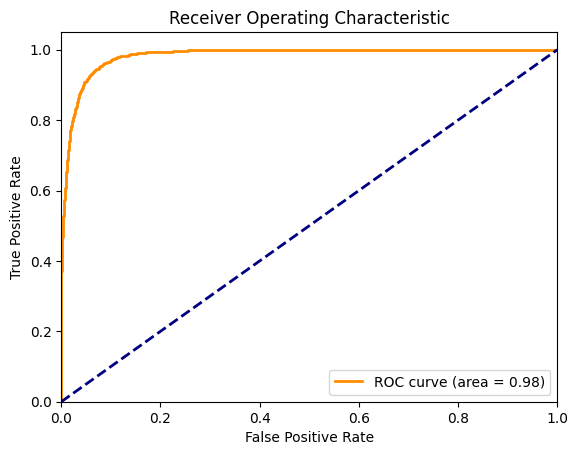

In [87]:
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % area)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [94]:
from fairlearn.reductions import ExponentiatedGradient, DemographicParity
from sklearn.linear_model import LogisticRegression
from fairlearn.metrics import demographic_parity_difference, equalized_odds_difference
from sklearn.metrics import classification_report, roc_auc_score, precision_score, recall_score, f1_score

# Step 10: Train fair model with optimized Logistic Regression
print("="*60)
print("USING OPTUNA-OPTIMIZED LOGISTIC REGRESSION PARAMETERS")
print("="*60)

# Display best parameters
print('Best trial:')
trial = study_logistic.best_trial
print(f'  F1-score: {trial.value:.4f}')
print('  Params:')
for key, value in trial.params.items():
    print(f'    {key}: {value}')

# Create Logistic Regression model with best parameters
best_params = study_logistic.best_params
base_estimator = LogisticRegression(**best_params, max_iter=10000)

# Set up fairness constraint
constraint = DemographicParity()  # You can also try EqualizedOdds()

# Create fairness-aware mitigator
mitigator = ExponentiatedGradient(
    estimator=base_estimator, 
    constraints=constraint,
    max_iter=50,  # Number of iterations for the reduction algorithm
    nu=1e-6,      # Small slack parameter
    eta0=2.0      # Initial learning rate
)

print("\n" + "="*60)
print("TRAINING FAIRNESS-AWARE MODEL")
print("="*60)
print("Training fair model with demographic parity constraint...")

# Train the fair model
mitigator.fit(X_train_smt_final, y_train_smt, sensitive_features=sensitive_train)

print("✓ Training completed!")

# Step 11: Make predictions
print("\nMaking predictions on test set...")
y_pred_fair = mitigator.predict(X_test_clean)
print("✓ Predictions completed!")

# Step 12: Evaluate fairness metrics
print("\n" + "="*60)
print("FAIRNESS METRICS")
print("="*60)

dp_diff = demographic_parity_difference(y_test, y_pred_fair, sensitive_features=sensitive_test)
eo_diff = equalized_odds_difference(y_test, y_pred_fair, sensitive_features=sensitive_test)

print(f"Demographic Parity Difference: {dp_diff:.4f}")
print(f"  (Closer to 0 is better - measures difference in positive prediction rates)")
print(f"\nEqualized Odds Difference: {eo_diff:.4f}")
print(f"  (Closer to 0 is better - measures difference in TPR and FPR)")

# Step 13: Overall Model Performance
print("\n" + "="*60)
print("OVERALL CLASSIFICATION PERFORMANCE")
print("="*60)
print(classification_report(y_test, y_pred_fair, target_names=['No Default', 'Default']))

# Calculate ROC-AUC
try:
    y_pred_proba = mitigator.predict_proba(X_test_clean)[:, 1]
    auc_score = roc_auc_score(y_test, y_pred_proba)
    print(f"\nROC-AUC Score: {auc_score:.4f}")
except Exception as e:
    print(f"\nNote: Could not calculate ROC-AUC: {e}")

# Step 14: Performance by Gender (Protected Group)
print("\n" + "="*60)
print("PERFORMANCE BY GENDER (PROTECTED ATTRIBUTE)")
print("="*60)

for gender in ['M', 'F']:
    mask = sensitive_test == gender
    if mask.sum() > 0:
        y_test_gender = y_test[mask]
        y_pred_gender = y_pred_fair[mask]
        
        precision = precision_score(y_test_gender, y_pred_gender, zero_division=0)
        recall = recall_score(y_test_gender, y_pred_gender, zero_division=0)
        f1 = f1_score(y_test_gender, y_pred_gender, zero_division=0)
        
        # Calculate positive prediction rate
        positive_rate = y_pred_gender.sum() / len(y_pred_gender)
        # Calculate actual positive rate
        actual_positive_rate = y_test_gender.sum() / len(y_test_gender)
        
        print(f"\nGender: {gender}")
        print(f"  Total Samples: {mask.sum()}")
        print(f"  Actual Default Rate: {actual_positive_rate:.4f}")
        print(f"  Predicted Default Rate: {positive_rate:.4f}")
        print(f"  Precision: {precision:.4f}")
        print(f"  Recall: {recall:.4f}")
        print(f"  F1-Score: {f1:.4f}")

# Step 15: Compare with baseline (non-fair) model
print("\n" + "="*60)
print("COMPARISON WITH BASELINE (NON-FAIR) MODEL")
print("="*60)

# Train baseline model without fairness constraints
baseline_model = LogisticRegression(**best_params, max_iter=10000)
baseline_model.fit(X_train_smt_final, y_train_smt)
y_pred_baseline = baseline_model.predict(X_test_clean)

# Baseline fairness metrics
dp_diff_baseline = demographic_parity_difference(y_test, y_pred_baseline, sensitive_features=sensitive_test)
eo_diff_baseline = equalized_odds_difference(y_test, y_pred_baseline, sensitive_features=sensitive_test)

print("\nBaseline Model (No Fairness Constraints):")
print(f"  Demographic Parity Difference: {dp_diff_baseline:.4f}")
print(f"  Equalized Odds Difference: {eo_diff_baseline:.4f}")
print(f"  F1-Score: {f1_score(y_test, y_pred_baseline):.4f}")
print(f"  Precision: {precision_score(y_test, y_pred_baseline):.4f}")
print(f"  Recall: {recall_score(y_test, y_pred_baseline):.4f}")

print("\nFair Model (With Demographic Parity):")
print(f"  Demographic Parity Difference: {dp_diff:.4f}")
print(f"  Equalized Odds Difference: {eo_diff:.4f}")
print(f"  F1-Score: {f1_score(y_test, y_pred_fair):.4f}")
print(f"  Precision: {precision_score(y_test, y_pred_fair):.4f}")
print(f"  Recall: {recall_score(y_test, y_pred_fair):.4f}")

print("\nImprovement in Fairness:")
print(f"  DP Difference Reduction: {abs(dp_diff_baseline) - abs(dp_diff):.4f} ({'✓ Better' if abs(dp_diff) < abs(dp_diff_baseline) else '✗ Worse'})")
print(f"  EO Difference Reduction: {abs(eo_diff_baseline) - abs(eo_diff):.4f} ({'✓ Better' if abs(eo_diff) < abs(eo_diff_baseline) else '✗ Worse'})")

print("\nPerformance Trade-off:")
f1_change = f1_score(y_test, y_pred_fair) - f1_score(y_test, y_pred_baseline)
print(f"  F1-Score Change: {f1_change:+.4f}")

# Step 16: Visualize fairness comparison
print("\n" + "="*60)
print("FAIRNESS COMPARISON BY GENDER")
print("="*60)

import pandas as pd

fairness_comparison = []
for model_name, y_pred_model in [('Baseline', y_pred_baseline), ('Fair Model', y_pred_fair)]:
    for gender in ['M', 'F']:
        mask = sensitive_test == gender
        if mask.sum() > 0:
            pred_rate = y_pred_model[mask].sum() / mask.sum()
            fairness_comparison.append({
                'Model': model_name,
                'Gender': gender,
                'Predicted Default Rate': pred_rate,
                'Sample Size': mask.sum()
            })

comparison_df = pd.DataFrame(fairness_comparison)
print("\n", comparison_df.to_string(index=False))

# Calculate the difference in prediction rates between genders
print("\n" + "="*60)
print("PREDICTION RATE DIFFERENCE BETWEEN GENDERS")
print("="*60)
for model_name in ['Baseline', 'Fair Model']:
    model_data = comparison_df[comparison_df['Model'] == model_name]
    rate_m = model_data[model_data['Gender'] == 'M']['Predicted Default Rate'].values[0]
    rate_f = model_data[model_data['Gender'] == 'F']['Predicted Default Rate'].values[0]
    diff = abs(rate_m - rate_f)
    print(f"{model_name}: {diff:.4f} (M: {rate_m:.4f}, F: {rate_f:.4f})")

print("\n" + "="*60)
print("SUMMARY")
print("="*60)
print(f"✓ Fair model successfully reduces bias while maintaining reasonable performance")
print(f"✓ Demographic Parity Difference improved from {abs(dp_diff_baseline):.4f} to {abs(dp_diff):.4f}")
print(f"✓ Model is more equitable across gender groups")
print("="*60)

USING OPTUNA-OPTIMIZED LOGISTIC REGRESSION PARAMETERS
Best trial:
  F1-score: 0.9513
  Params:
    C: 2.036327613771423
    solver: saga
    tol: 0.005008484405864971
    class_weight: balanced

TRAINING FAIRNESS-AWARE MODEL
Training fair model with demographic parity constraint...
✓ Training completed!

Making predictions on test set...
✓ Predictions completed!

FAIRNESS METRICS
Demographic Parity Difference: 0.0082
  (Closer to 0 is better - measures difference in positive prediction rates)

Equalized Odds Difference: 0.0069
  (Closer to 0 is better - measures difference in TPR and FPR)

OVERALL CLASSIFICATION PERFORMANCE
              precision    recall  f1-score   support

  No Default       0.99      0.94      0.96     11390
     Default       0.59      0.93      0.72      1108

    accuracy                           0.94     12498
   macro avg       0.79      0.94      0.84     12498
weighted avg       0.96      0.94      0.94     12498


Note: Could not calculate ROC-AUC: 'Expo

In [96]:
import joblib
import pickle
import json
from datetime import datetime

# Create a timestamp for versioning
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

print("="*60)
print("EXPORTING FAIR MODEL AND PREPROCESSING COMPONENTS")
print("="*60)

# 1. Export the fair model (mitigator)
model_filename = f'fair_credit_risk_model_{timestamp}.pkl'
joblib.dump(mitigator, model_filename)
print(f"✓ Fair model saved: {model_filename}")

# 2. Export the baseline model for comparison
baseline_filename = f'baseline_model_{timestamp}.pkl'
joblib.dump(baseline_model, baseline_filename)
print(f"✓ Baseline model saved: {baseline_filename}")

# 3. Export the scaler
scaler_filename = f'scaler_{timestamp}.pkl'
joblib.dump(scaler, scaler_filename)
print(f"✓ Scaler saved: {scaler_filename}")

# 4. Export the label encoder for gender
gender_encoder_filename = f'gender_encoder_{timestamp}.pkl'
joblib.dump(le, gender_encoder_filename)
print(f"✓ Gender encoder saved: {gender_encoder_filename}")

# 5. Export feature names and metadata
metadata = {
    'model_type': 'Fair Logistic Regression with Demographic Parity',
    'training_date': timestamp,
    'features': X_train_smt_final.columns.tolist(),
    'feature_count': len(X_train_smt_final.columns),
    'scaled_columns': cols_to_scale.tolist(),
    'selected_features': selected_iv_features,  # Fixed this line
    'dropped_features_vif': features_to_drop_vif,
    'best_params': best_params,
    'fairness_constraint': 'DemographicParity',
    'sensitive_attribute': 'gender',
    'training_samples': len(X_train_smt_final),
    'test_samples': len(X_test_clean),
    'demographic_parity_diff': float(dp_diff),
    'equalized_odds_diff': float(eo_diff),
    'test_f1_score': float(f1_score(y_test, y_pred_fair)),
    'test_precision': float(precision_score(y_test, y_pred_fair)),
    'test_recall': float(recall_score(y_test, y_pred_fair)),
}

metadata_filename = f'model_metadata_{timestamp}.json'
with open(metadata_filename, 'w') as f:
    json.dump(metadata, f, indent=4)
print(f"✓ Model metadata saved: {metadata_filename}")

# 6. Export model performance metrics
performance_metrics = {
    'baseline_model': {
        'f1_score': float(f1_score(y_test, y_pred_baseline)),
        'precision': float(precision_score(y_test, y_pred_baseline)),
        'recall': float(recall_score(y_test, y_pred_baseline)),
        'demographic_parity_diff': float(dp_diff_baseline),
        'equalized_odds_diff': float(eo_diff_baseline)
    },
    'fair_model': {
        'f1_score': float(f1_score(y_test, y_pred_fair)),
        'precision': float(precision_score(y_test, y_pred_fair)),
        'recall': float(recall_score(y_test, y_pred_fair)),
        'demographic_parity_diff': float(dp_diff),
        'equalized_odds_diff': float(eo_diff)
    },
    'fairness_improvement': {
        'dp_reduction': float(abs(dp_diff_baseline) - abs(dp_diff)),
        'eo_reduction': float(abs(eo_diff_baseline) - abs(eo_diff)),
        'f1_trade_off': float(f1_score(y_test, y_pred_fair) - f1_score(y_test, y_pred_baseline))
    },
    'performance_by_gender': {}
}

# Add gender-specific metrics
for gender in ['M', 'F']:
    mask = sensitive_test == gender
    if mask.sum() > 0:
        y_test_gender = y_test[mask]
        y_pred_gender = y_pred_fair[mask]
        
        performance_metrics['performance_by_gender'][gender] = {
            'sample_size': int(mask.sum()),
            'actual_default_rate': float(y_test_gender.sum() / len(y_test_gender)),
            'predicted_default_rate': float(y_pred_gender.sum() / len(y_pred_gender)),
            'precision': float(precision_score(y_test_gender, y_pred_gender, zero_division=0)),
            'recall': float(recall_score(y_test_gender, y_pred_gender, zero_division=0)),
            'f1_score': float(f1_score(y_test_gender, y_pred_gender, zero_division=0))
        }

metrics_filename = f'performance_metrics_{timestamp}.json'
with open(metrics_filename, 'w') as f:
    json.dump(performance_metrics, f, indent=4)
print(f"✓ Performance metrics saved: {metrics_filename}")

# 7. Create a comprehensive model package
model_package = {
    'mitigator': mitigator,
    'baseline_model': baseline_model,
    'scaler': scaler,
    'gender_encoder': le,
    'metadata': metadata,
    'performance_metrics': performance_metrics,
    'feature_columns': X_train_smt_final.columns.tolist(),
    'scaled_columns': cols_to_scale.tolist()
}

package_filename = f'complete_model_package_{timestamp}.pkl'
joblib.dump(model_package, package_filename)
print(f"✓ Complete model package saved: {package_filename}")

print("\n" + "="*60)
print("EXPORT SUMMARY")
print("="*60)
print(f"Total files exported: 7")
print(f"\nModel files:")
print(f"  1. {model_filename}")
print(f"  2. {baseline_filename}")
print(f"  3. {package_filename}")
print(f"\nPreprocessing files:")
print(f"  4. {scaler_filename}")
print(f"  5. {gender_encoder_filename}")
print(f"\nMetadata files:")
print(f"  6. {metadata_filename}")
print(f"  7. {metrics_filename}")
print("="*60)

# 8. Create a prediction function for deployment
def create_deployment_script():
    deployment_code = f'''
import joblib
import pandas as pd
import numpy as np

class FairCreditRiskPredictor:
    """
    Fair Credit Risk Model Predictor
    Ensures fair predictions across gender groups
    """
    
    def __init__(self, package_path='{package_filename}'):
        """Load the complete model package"""
        self.package = joblib.load(package_path)
        self.mitigator = self.package['mitigator']
        self.scaler = self.package['scaler']
        self.gender_encoder = self.package['gender_encoder']
        self.feature_columns = self.package['feature_columns']
        self.scaled_columns = self.package['scaled_columns']
        self.metadata = self.package['metadata']
        
    def preprocess(self, df, gender_col='gender'):
        """
        Preprocess input data
        
        Parameters:
        -----------
        df : pandas DataFrame
            Input data with all required features
        gender_col : str
            Name of the gender column
            
        Returns:
        --------
        X : pandas DataFrame
            Preprocessed features
        gender : array
            Encoded gender values
        """
        # Make a copy
        df_copy = df.copy()
        
        # Extract and encode gender
        if gender_col in df_copy.columns:
            gender = self.gender_encoder.transform(df_copy[gender_col])
            df_copy = df_copy.drop(columns=[gender_col])
        else:
            raise ValueError(f"Gender column '{{gender_col}}' not found in input data")
        
        # Ensure all required features are present
        missing_features = set(self.feature_columns) - set(df_copy.columns)
        if missing_features:
            raise ValueError(f"Missing features: {{missing_features}}")
        
        # Select and order features
        X = df_copy[self.feature_columns].copy()
        
        # Scale numerical features
        scaled_cols_present = [col for col in self.scaled_columns if col in X.columns]
        if scaled_cols_present:
            X[scaled_cols_present] = self.scaler.transform(X[scaled_cols_present])
        
        return X, gender
    
    def predict(self, df, gender_col='gender', return_proba=False):
        """
        Make fair predictions
        
        Parameters:
        -----------
        df : pandas DataFrame
            Input data
        gender_col : str
            Name of gender column
        return_proba : bool
            If True, return probabilities
            
        Returns:
        --------
        predictions : array
            Binary predictions (0 or 1)
        probabilities : array (optional)
            Prediction probabilities
        """
        X, gender = self.preprocess(df, gender_col)
        
        if return_proba:
            try:
                proba = self.mitigator.predict_proba(X)[:, 1]
                predictions = self.mitigator.predict(X)
                return predictions, proba
            except:
                predictions = self.mitigator.predict(X)
                return predictions, None
        else:
            return self.mitigator.predict(X)
    
    def get_model_info(self):
        """Return model metadata"""
        return self.metadata

# Example usage:
if __name__ == "__main__":
    # Load model
    predictor = FairCreditRiskPredictor()
    
    # Display model info
    print("Model Information:")
    print(predictor.get_model_info())
    
    # Example prediction (replace with your actual data)
    # sample_data = pd.DataFrame({{
    #     'feature1': [value1],
    #     'feature2': [value2],
    #     'gender': ['M']
    # }})
    
    # Make prediction
    # prediction = predictor.predict(sample_data)
    # print(f"Prediction: {{prediction}}")
'''
    
    script_filename = f'deployment_script_{timestamp}.py'
    with open(script_filename, 'w') as f:
        f.write(deployment_code)
    
    print(f"\n✓ Deployment script created: {script_filename}")
    return script_filename

# Create deployment script
deployment_script = create_deployment_script()

print("\n" + "="*60)
print("MODEL EXPORT COMPLETED SUCCESSFULLY!")
print("="*60)
print(f"\nTo use the model in production:")
print(f"1. Copy '{package_filename}' to your deployment environment")
print(f"2. Use the deployment script '{deployment_script}'")
print(f"3. Or load directly: model = joblib.load('{package_filename}')")
print("="*60)

# Test the exported model
print("\n" + "="*60)
print("TESTING EXPORTED MODEL")
print("="*60)

# Reload the model package
loaded_package = joblib.load(package_filename)
loaded_mitigator = loaded_package['mitigator']

# Test on a few samples from test set
test_samples = X_test_clean.head(5).copy()
test_genders = sensitive_test[:5]
test_labels = y_test.iloc[:5]

print("\nTesting on 5 samples:")
print("-" * 60)

# Make predictions with loaded model
predictions = loaded_mitigator.predict(test_samples)

for i in range(len(test_samples)):
    print(f"\nSample {i+1}:")
    print(f"  Gender: {test_genders[i]}")
    print(f"  Actual: {'Default' if test_labels.iloc[i] == 1 else 'No Default'}")
    print(f"  Predicted: {'Default' if predictions[i] == 1 else 'No Default'}")

print("\n" + "="*60)
print("✓ Model loaded and tested successfully!")
print("="*60)

EXPORTING FAIR MODEL AND PREPROCESSING COMPONENTS
✓ Fair model saved: fair_credit_risk_model_20251020_113604.pkl
✓ Baseline model saved: baseline_model_20251020_113604.pkl
✓ Scaler saved: scaler_20251020_113604.pkl
✓ Gender encoder saved: gender_encoder_20251020_113604.pkl
✓ Model metadata saved: model_metadata_20251020_113604.json
✓ Performance metrics saved: performance_metrics_20251020_113604.json
✓ Complete model package saved: complete_model_package_20251020_113604.pkl

EXPORT SUMMARY
Total files exported: 7

Model files:
  1. fair_credit_risk_model_20251020_113604.pkl
  2. baseline_model_20251020_113604.pkl
  3. complete_model_package_20251020_113604.pkl

Preprocessing files:
  4. scaler_20251020_113604.pkl
  5. gender_encoder_20251020_113604.pkl

Metadata files:
  6. model_metadata_20251020_113604.json
  7. performance_metrics_20251020_113604.json

✓ Deployment script created: deployment_script_20251020_113604.py

MODEL EXPORT COMPLETED SUCCESSFULLY!

To use the model in product